In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

In [2]:
%pylab inline
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

################################################################################

from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import glob
import cv2
import os
from datetime import datetime

################################################################################

import tensorflow.compat.v2 as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.python.keras.losses import BinaryCrossentropy
from tensorflow.keras.applications.vgg16 import VGG16
from segmentation_models.losses import jaccard_loss, dice_loss, categorical_focal_loss, categorical_focal_jaccard_loss, categorical_focal_dice_loss

################################################################################
try :
    import import_ipynb
except :
    !pip install import-ipynb
    import import_ipynb
from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022 import *

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
Segmentation Models: using `keras` framework.
importing Jupyter notebook from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022.ipynb


In [3]:
config = tf.compat.v1.ConfigProto( device_count = { 'GPU': 5 , 'CPU': 1 } )
sess = tf.compat.v1.Session( config = config )
keras.backend.set_session( sess )

In [4]:
tf.config.list_physical_devices("GPU")

[]

In [5]:
tf.__version__

'2.9.1'

In [6]:
keras.__version__

'2.9.0'

In [7]:
pd.__version__

'1.4.4'

In [8]:
np.__version__

'1.21.5'

In [9]:
model_name = "Transfert_learning_UNET"

# <strong> I - Acquisition des données à utiliserMaxNLocator

- ###  <strong> Chemin d'accès aux fichiers images et aux masks </strong>

In [10]:
chemin_image = os.getcwd()+"/datas/contraste/" 
chemin_masque_labelIds = os.getcwd()+"/datas/masque_labelIds/" 

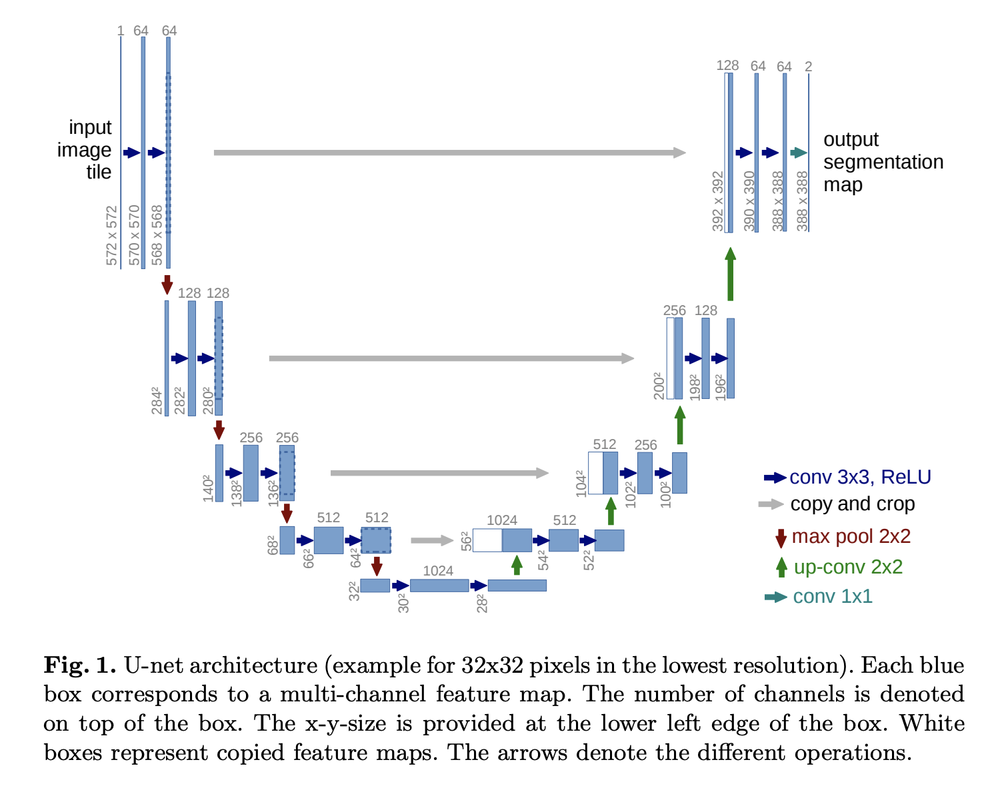

# <strong> II - Construction du modèle

- ###  <strong> definition </strong>

In [11]:
# Modèle UNET préentrainé sur Imagenet avec une couche de compression de type VGG16
def TL_unet_model(input_shape, Canaux_de_sortie, by = "seg_model"):

    if by =="build" :
        base_VGG = VGG16(include_top = False, 
                       weights = "imagenet", 
                       input_shape = input_shape)

        # On interdit l'entrainement des couche de convolution du modèle VGG16
        # Uniquement les paramètres de la couche de décodage seront entrainés
        for layer in base_VGG.layers: 
            layer.trainable = False

        # the bridge (exclude the last maxpooling layer in VGG16) 
        bridge = base_VGG.get_layer("block5_conv3").output
        #print(bridge.shape)

        # Décodeur
        up1 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bridge)
        #print(up1.shape)
        concat_1 = concatenate([up1, base_VGG.get_layer("block4_conv3").output], axis=3)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(concat_1)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

        up2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
        #print(up2.shape)
        concat_2 = concatenate([up2, base_VGG.get_layer("block3_conv3").output], axis=3)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(concat_2)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

        up3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
        #print(up3.shape)
        concat_3 = concatenate([up3, base_VGG.get_layer("block2_conv2").output], axis=3)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(concat_3)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

        up4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
        #print(up4.shape)
        concat_4 = concatenate([up4, base_VGG.get_layer("block1_conv2").output], axis=3)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(concat_4)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)

        conv10 = Conv2D(Canaux_de_sortie, (1, 1), activation='softmax')(conv9)
        #print(conv10.shape)

        model = Model( base_VGG.input, conv10 )
    elif by == "seg_model" :
        from segmentation_models import Unet
        
        model = Unet( 
                backbone_name='vgg16',
                input_shape= input_shape,
                classes= Canaux_de_sortie,
                activation='softmax',
                weights=None,
                encoder_weights='imagenet',
                encoder_freeze=True,
                encoder_features='default',
                decoder_block_type='upsampling',
                decoder_filters=(256, 128, 64, 32, 16),
                decoder_use_batchnorm=True,
                
                )
    
    model.summary()
    return model

# <strong> A - Sans augmentation de données avec fonction perte de type jaccard_loss

In [12]:
#resolution des images et masques
aug_1 = False
perte_1 = "jaccard_loss"
img_res = (128,256,3)

In [13]:
model_1 = TL_unet_model( img_res , 8)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

In [14]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_1.compile(optimizer = Adam(lr = 2.e-2), 
                loss = jaccard_loss , 
                metrics = [ ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_1 = f"models/{model_name}_Loss={perte_1}_aug={aug_1}_/cp.ckpt"
checkpoint_dir_1 = os.path.dirname(checkpoint_path_1)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_1 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_1,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq=125
                                                  )
early_stopping_1 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_1 = False

In [15]:
if  charger_les_poids_1 :
    model_1.load_weights(checkpoint_path_1)
    
history_1 = model_1.fit_generator( 
    generator = MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_1, taille_des_donnees= 50, target_size=img_res),
    validation_data = MyImagesGenerator(chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_1, taille_des_donnees= 20, target_size=img_res),
    epochs= 450,
    max_queue_size=12,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_1 , early_stopping_1] ,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_1.save(checkpoint_dir_1+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")


Epoch 1/450
2/2 [==============================] - 29s 16s/step - loss: 0.9394 - ARI_score: 2.0043 - mean_IoU: 0.0833 - dice_coeff: 0.1529 - Tversky_coef: 0.2049 - val_loss: 0.9775 - val_ARI_score: 0.5933 - val_mean_IoU: 0.0991 - val_dice_coeff: 0.1800 - val_Tversky_coef: 0.2069 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 26s 14s/step - loss: 0.8832 - ARI_score: -14.9618 - mean_IoU: 0.2009 - dice_coeff: 0.3324 - Tversky_coef: 0.2212 - val_loss: 0.9668 - val_ARI_score: 3.5287 - val_mean_IoU: 0.1032 - val_dice_coeff: 0.1866 - val_Tversky_coef: 0.2075 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 27s 14s/step - loss: 0.8130 - ARI_score: 2.3771 - mean_IoU: 0.3476 - dice_coeff: 0.5158 - Tversky_coef: 0.2370 - val_loss: 0.9629 - val_ARI_score: 0.0329 - val_mean_IoU: 0.1063 - val_dice_coeff: 0.1921 - val_Tversky_coef: 0.2080 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 26s 14s/step - loss: 0.7740 - ARI_score: 1.1326 - mean_IoU: 0.3839 -

In [16]:
result_1  = pd.DataFrame( history_1.history )
result_1.drop(["lr"], axis=1, inplace=True)
result_1["modèle"] = [model_name for _ in range( result_1.shape[0])]
result_1["Loss"] = [perte_1 for _ in range( result_1.shape[0])]
result_1["Augmentation"] = [aug_1 for _ in range( result_1.shape[0])]
result_1.to_csv( f"{model_name}_loss={perte_1}_augment={aug_1}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index = False )
result_1

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.939393,2.004315,0.083287,0.152911,0.204850,0.977508,0.593252,0.099098,0.180045,0.206885,Transfert_learning_UNET,jaccard_loss,False
1,0.883250,-14.961750,0.200931,0.332413,0.221216,0.966833,3.528742,0.103196,0.186632,0.207461,Transfert_learning_UNET,jaccard_loss,False
2,0.812993,2.377055,0.347566,0.515760,0.237041,0.962888,0.032889,0.106336,0.192115,0.207951,Transfert_learning_UNET,jaccard_loss,False
3,0.773958,1.132585,0.383937,0.554769,0.240401,0.962567,-1.607560,0.106148,0.191891,0.207931,Transfert_learning_UNET,jaccard_loss,False
4,0.745552,-1.495135,0.401322,0.572714,0.241879,0.958043,-14.693116,0.105799,0.191136,0.207864,Transfert_learning_UNET,jaccard_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,0.354547,-0.028141,0.797353,0.887237,0.269435,0.643559,1.557831,0.512421,0.677428,0.250861,Transfert_learning_UNET,jaccard_loss,False
83,0.354539,-0.017768,0.790931,0.883104,0.269072,0.620730,-1.480507,0.546726,0.706025,0.253375,Transfert_learning_UNET,jaccard_loss,False
84,0.355522,-1.549569,0.792821,0.884416,0.269184,0.709145,-2.552486,0.377133,0.547645,0.239410,Transfert_learning_UNET,jaccard_loss,False
85,0.362093,-0.490693,0.790888,0.883204,0.269079,0.632069,-1.303446,0.502111,0.668493,0.250066,Transfert_learning_UNET,jaccard_loss,False


In [17]:
start = 2

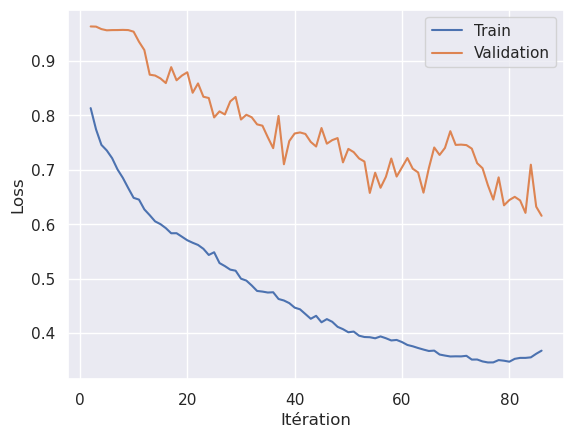

In [18]:
plt.plot(result_1.index[start:], result_1["loss"][start:])
plt.plot(result_1.index[start:], result_1["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


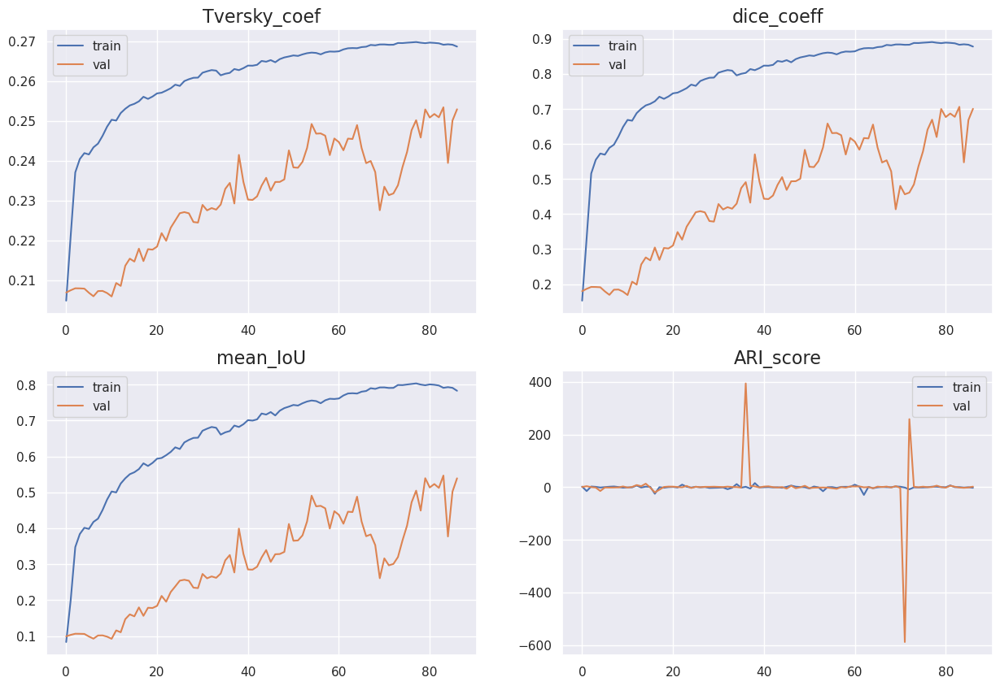

In [19]:
afficher_les_metriques( result_1 )

In [20]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_1, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [21]:
img.shape

(10, 128, 256, 3)

In [22]:
mask.shape

(10, 128, 256, 8)

In [23]:
mask_pred = model_1.predict(img)

1/1 [==============================] - 1s 1s/step


In [24]:
mask_pred.shape

(10, 128, 256, 8)

In [25]:
transformer = Mask_To_8_Groups( )

In [26]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred ]

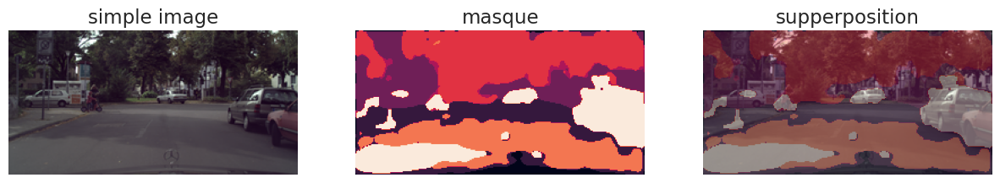

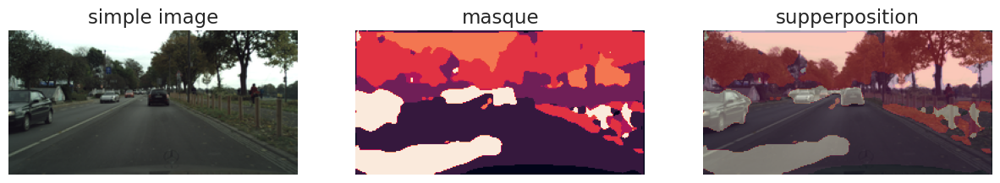

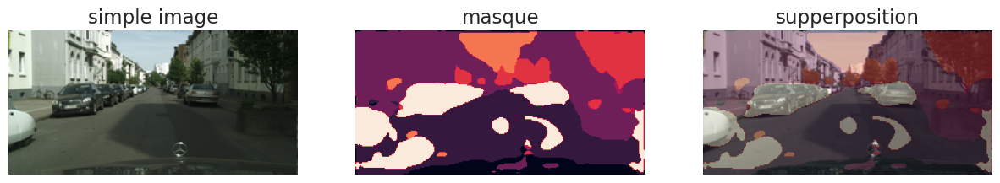

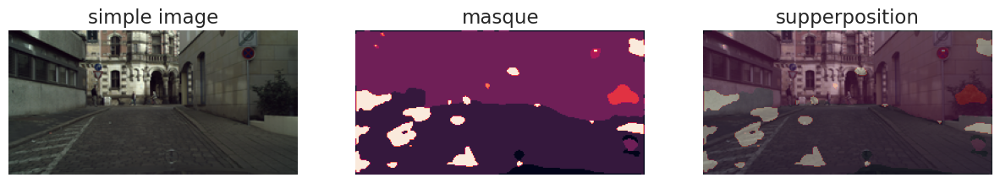

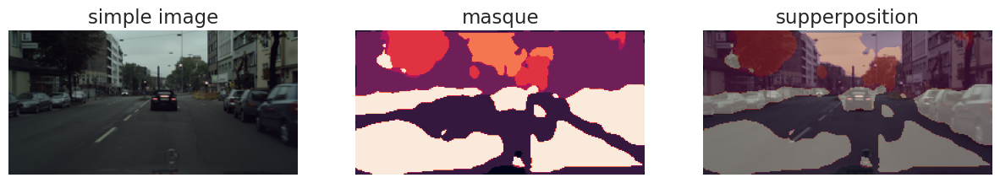

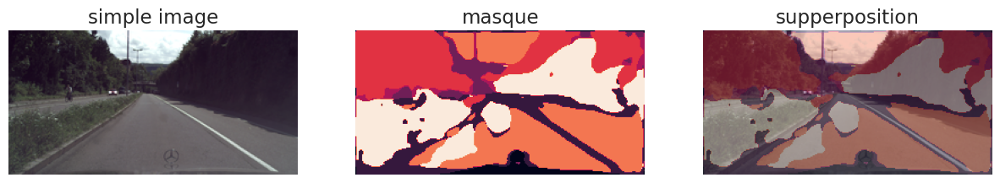

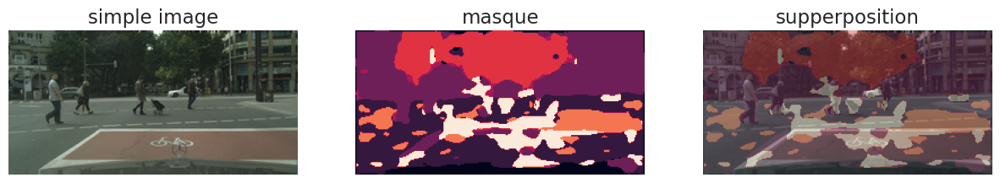

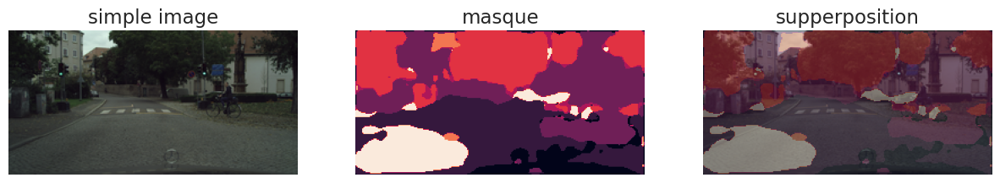

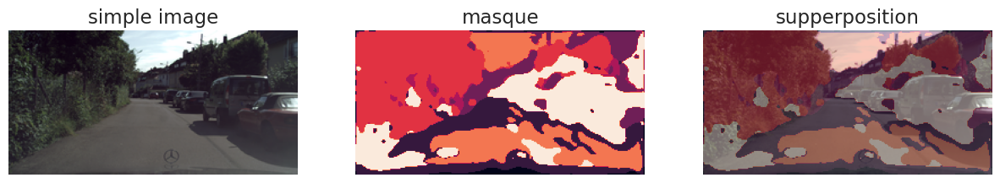

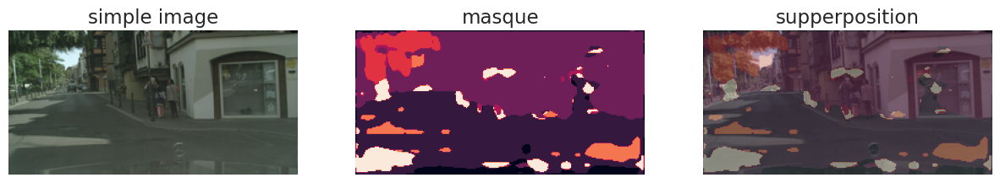

In [27]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> B - Sans augmentation de données et fonction perte de type dice_loss

In [28]:
#resolution des images et masques
aug_2 = False
perte_2 = "dice_loss"
img_res = (128,256,3)

In [29]:
model_2 = TL_unet_model( img_res , 8)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [30]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_2.compile(optimizer = Adam(lr = 2.e-2),
                loss = dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_2 = f"models/{model_name}_Loss={perte_2}_aug={aug_2}_/cp.ckpt"
checkpoint_dir_2 = os.path.dirname(checkpoint_path_2)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_2 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_2,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 125
                                                  )
early_stopping_2 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_2 = False

In [31]:
if charger_les_poids_2 : 
    model_2.load_weights(checkpoint_path_2)
    

history_2 = model_2.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_2, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,2, True, augmentation=aug_2, taille_des_donnees= 5, target_size=img_res),
    epochs=450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_2, early_stopping_2 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_2.save(checkpoint_dir_2+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 32s 16s/step - loss: 0.7920 - ARI_score: 2.0009 - mean_IoU: 0.1178 - dice_coeff: 0.2080 - Tversky_coef: 0.2099 - val_loss: 0.7667 - val_ARI_score: 2529.7717 - val_mean_IoU: 0.1420 - val_dice_coeff: 0.2471 - val_Tversky_coef: 0.2130 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 31s 13s/step - loss: 0.5132 - ARI_score: 0.4182 - mean_IoU: 0.3228 - dice_coeff: 0.4868 - Tversky_coef: 0.2343 - val_loss: 0.7667 - val_ARI_score: 556.8174 - val_mean_IoU: 0.1414 - val_dice_coeff: 0.2464 - val_Tversky_coef: 0.2129 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 24s 11s/step - loss: 0.4469 - ARI_score: 2.0067 - mean_IoU: 0.3827 - dice_coeff: 0.5531 - Tversky_coef: 0.2400 - val_loss: 0.7667 - val_ARI_score: -1325.1156 - val_mean_IoU: 0.1420 - val_dice_coeff: 0.2471 - val_Tversky_coef: 0.2130 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 24s 11s/step - loss: 0.4268 - ARI_score: 1.9952 - mean_IoU: 0

In [32]:
result_2  = pd.DataFrame( history_2.history )
result_2.drop(["lr"], axis = 1, inplace = True)
result_2["modèle"] = [model_name for _ in range( result_2.shape[0])]
result_2["Loss"] = [perte_2 for _ in range( result_2.shape[0])]
result_2["Augmentation"] = [aug_2 for _ in range( result_2.shape[0])]
result_2.to_csv(f"{model_name}_loss={perte_2}_augment={aug_2}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_2

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.792034,2.000898,0.117840,0.207966,0.209924,0.766743,2529.771729,0.142030,0.247127,0.212960,Transfert_learning_UNET,dice_loss,False
1,0.513225,0.418233,0.322776,0.486775,0.234342,0.766742,556.817444,0.141426,0.246375,0.212893,Transfert_learning_UNET,dice_loss,False
2,0.446940,2.006694,0.382712,0.553060,0.239953,0.766742,-1325.115601,0.142003,0.247128,0.212960,Transfert_learning_UNET,dice_loss,False
3,0.426767,1.995162,0.402884,0.573233,0.241670,0.766745,962.718567,0.124514,0.220148,0.210556,Transfert_learning_UNET,dice_loss,False
4,0.421952,-0.855387,0.406544,0.578048,0.242083,0.765441,237.305222,0.133108,0.232665,0.211681,Transfert_learning_UNET,dice_loss,False
5,0.415407,0.048317,0.413022,0.584593,0.242654,0.758992,-76.169121,0.129216,0.227511,0.211215,Transfert_learning_UNET,dice_loss,False
6,0.411478,-1.233309,0.417186,0.588522,0.242995,0.744025,-1209.324829,0.154286,0.265306,0.214569,Transfert_learning_UNET,dice_loss,False
7,0.407865,39.281219,0.421253,0.592135,0.243311,0.722597,2.844319,0.157117,0.270413,0.215000,Transfert_learning_UNET,dice_loss,False
8,0.405711,-1.441507,0.423522,0.594289,0.243501,0.698922,-4.164971,0.198941,0.326614,0.219987,Transfert_learning_UNET,dice_loss,False
9,0.404548,-2.676397,0.423966,0.595452,0.243604,0.687846,2.067326,0.184006,0.308658,0.218398,Transfert_learning_UNET,dice_loss,False


In [33]:
start = 0

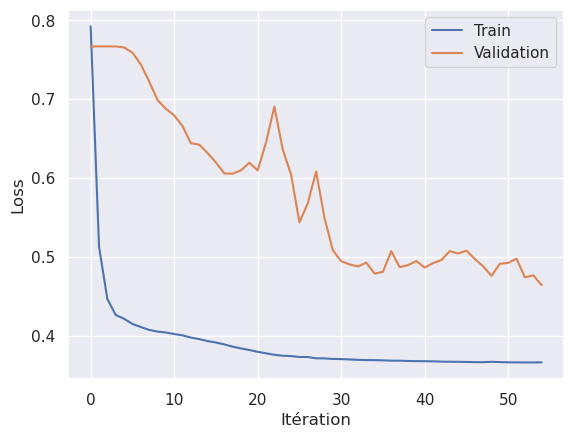

In [34]:
plt.plot(result_2.index[start:], result_2["loss"][start:])
plt.plot(result_2.index[start:], result_2["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


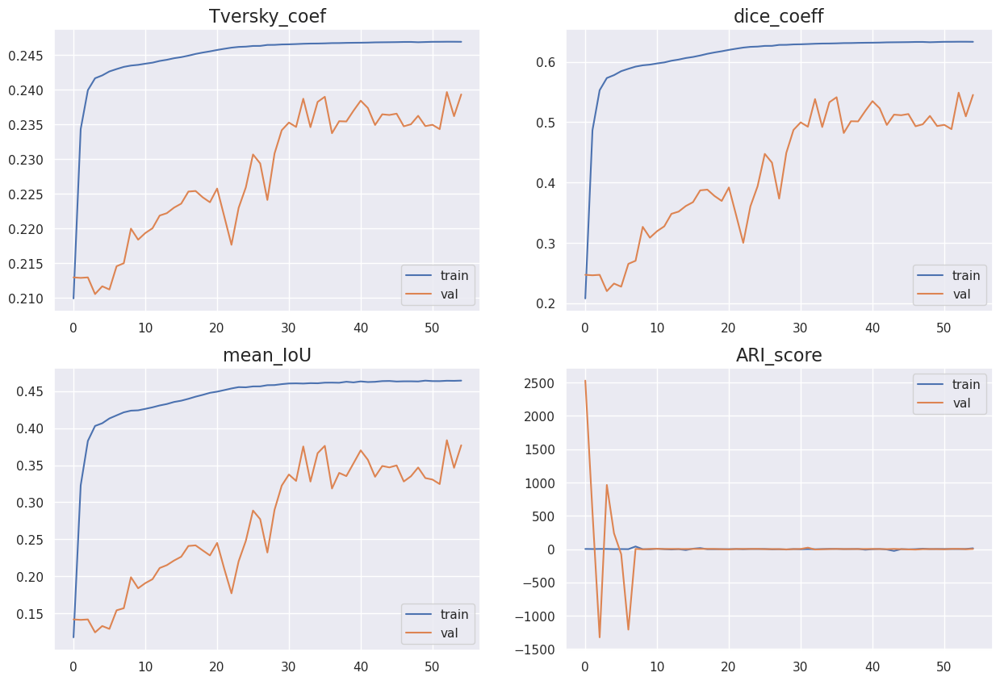

In [35]:
afficher_les_metriques( result_2 )

In [36]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_2, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [37]:
img.shape

(10, 128, 256, 3)

In [38]:
mask.shape

(10, 128, 256, 8)

In [39]:
mask_pred = model_2.predict(img)

1/1 [==============================] - 1s 1s/step


In [40]:
mask_pred.shape

(10, 128, 256, 8)

In [41]:
transformer = Mask_To_8_Groups()

In [42]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

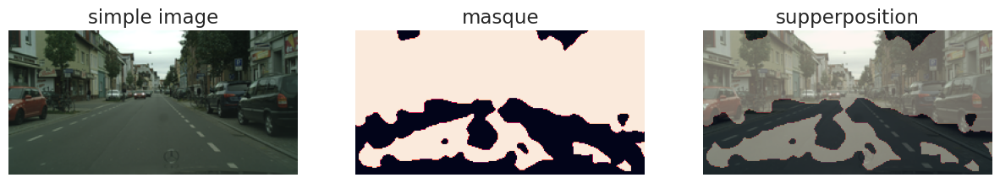

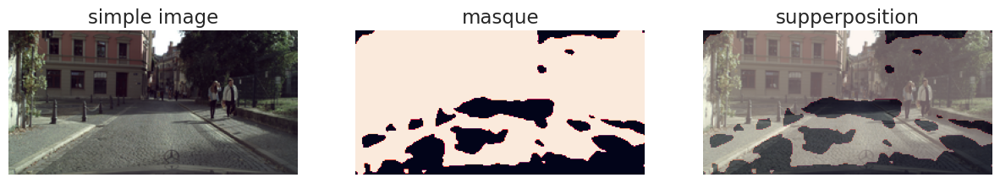

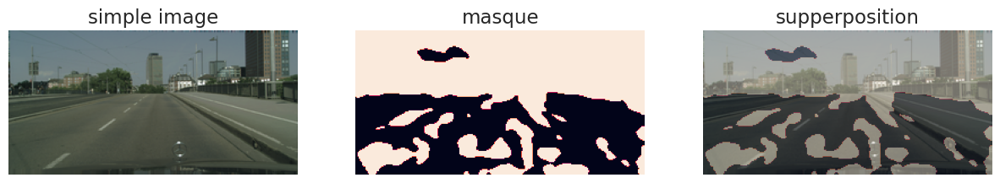

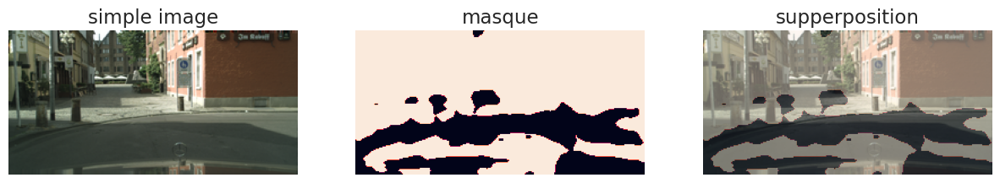

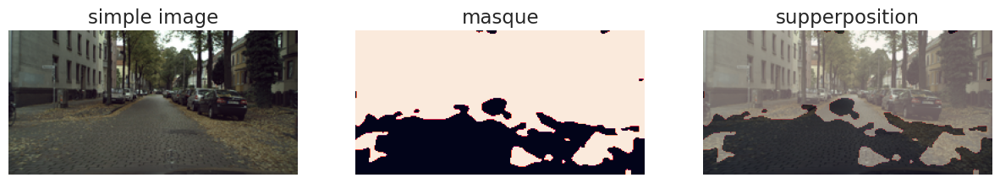

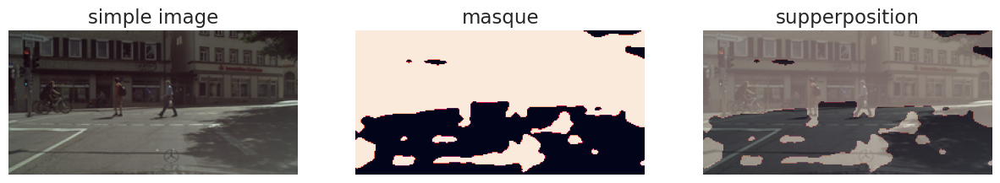

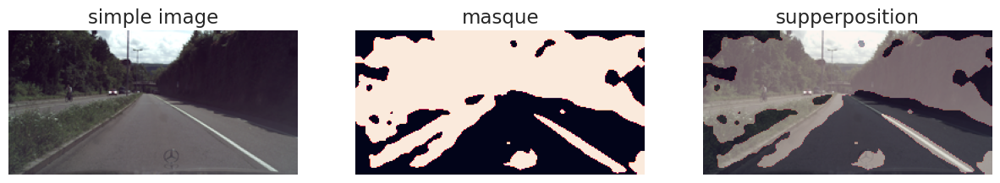

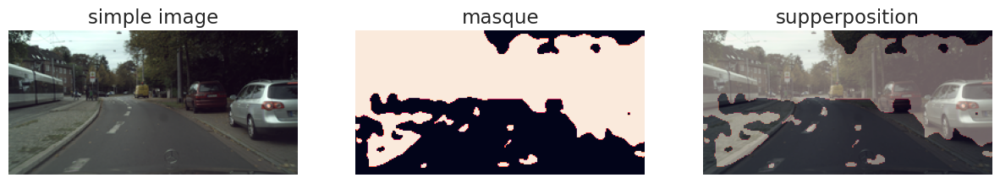

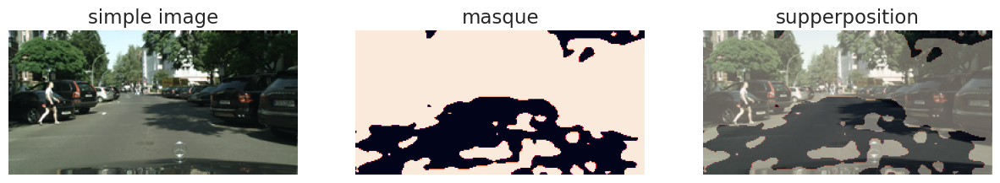

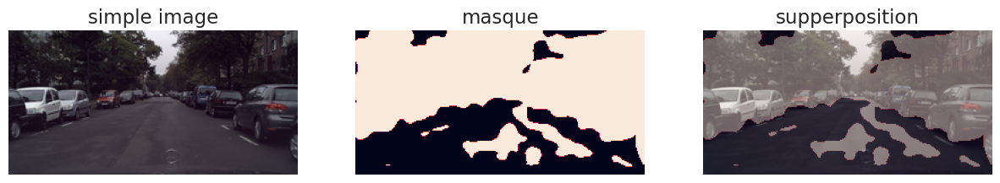

In [43]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> C - Sans augmentation de données avec fonction perte de type categorical_focal_loss

In [44]:
#resolution des images et masques
aug_3 = False
perte_3 = "categorical_focal_loss"
img_res = (128,256,3)

In [45]:
model_3 = TL_unet_model( img_res , 8)

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [46]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_3.compile(optimizer = Adam(lr = 2.e-2),
                loss = categorical_focal_loss ,
                metrics = [ARI_score, mean_IoU,dice_coeff, Tversky_coef ],
                run_eagerly=True 
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_3 = f"models/{model_name}_Loss={perte_3}_aug={aug_3}_/cp.ckpt"
checkpoint_dir_3 = os.path.dirname(checkpoint_path_3)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_3 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_3,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 125
                                                  )
early_stopping_3 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_3 = False

In [47]:
if charger_les_poids_3 :
    model_3.load_weights(checkpoint_path_3)
    

history_3 = model_3.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_3, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_3, taille_des_donnees= 20, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_3, early_stopping_3 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_3.save(checkpoint_dir_3+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 27s 14s/step - loss: 0.0488 - ARI_score: 2.0006 - mean_IoU: 0.1123 - dice_coeff: 0.1995 - Tversky_coef: 0.2091 - val_loss: 0.4800 - val_ARI_score: 0.3602 - val_mean_IoU: 0.0241 - val_dice_coeff: 0.0467 - val_Tversky_coef: 0.1952 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 26s 13s/step - loss: 0.0339 - ARI_score: 2.0005 - mean_IoU: 0.2238 - dice_coeff: 0.3657 - Tversky_coef: 0.2241 - val_loss: 0.4357 - val_ARI_score: 0.9783 - val_mean_IoU: 0.0530 - val_dice_coeff: 0.1005 - val_Tversky_coef: 0.2000 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 26s 13s/step - loss: 0.0268 - ARI_score: 2.0055 - mean_IoU: 0.1984 - dice_coeff: 0.3310 - Tversky_coef: 0.2213 - val_loss: 0.3138 - val_ARI_score: 0.3546 - val_mean_IoU: 0.1538 - val_dice_coeff: 0.2662 - val_Tversky_coef: 0.2145 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 26s 13s/step - loss: 0.0252 - ARI_score: 2.0007 - mean_IoU: 0.2155 - d

In [48]:
result_3  = pd.DataFrame( history_3.history )
result_3.drop(["lr"], axis = 1, inplace = True)
result_3["modèle"] = [model_name for _ in range( result_3.shape[0])]
result_3["Loss"] = [perte_3 for _ in range( result_3.shape[0])]
result_3["Augmentation"] = [aug_3 for _ in range( result_3.shape[0])]
result_3.to_csv(f"{model_name}_loss={perte_3}_augment={aug_3}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_3

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.048775,2.000584,0.112264,0.199525,0.209126,0.479963,0.360207,0.024070,0.046673,0.195237,Transfert_learning_UNET,categorical_focal_loss,False
1,0.033861,2.000518,0.223816,0.365719,0.224125,0.435690,0.978255,0.053002,0.100513,0.199994,Transfert_learning_UNET,categorical_focal_loss,False
2,0.026787,2.005505,0.198390,0.331023,0.221325,0.313846,0.354598,0.153841,0.266173,0.214497,Transfert_learning_UNET,categorical_focal_loss,False
3,0.025205,2.000706,0.215529,0.354325,0.223440,0.279966,0.456339,0.159602,0.274744,0.215333,Transfert_learning_UNET,categorical_focal_loss,False
4,0.024278,2.004983,0.261305,0.414268,0.228636,0.227792,1.805573,0.166604,0.285011,0.216331,Transfert_learning_UNET,categorical_focal_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,0.008132,2.019795,0.504416,0.670575,0.251429,0.026096,1.998717,0.359245,0.528053,0.238819,Transfert_learning_UNET,categorical_focal_loss,False
63,0.007983,2.000760,0.519803,0.684039,0.252582,0.025104,1.998717,0.356317,0.525236,0.238612,Transfert_learning_UNET,categorical_focal_loss,False
64,0.007867,2.001208,0.514266,0.679224,0.252190,0.024722,1.998716,0.350793,0.518892,0.238095,Transfert_learning_UNET,categorical_focal_loss,False
65,0.007975,2.013482,0.512969,0.678091,0.252084,0.032315,1.998716,0.323991,0.489283,0.235304,Transfert_learning_UNET,categorical_focal_loss,False


In [49]:
start = 3

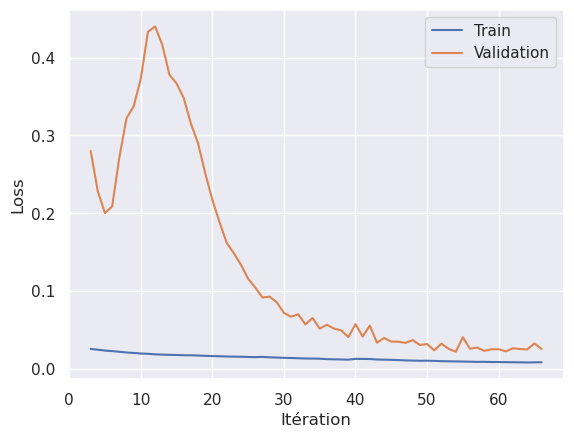

In [50]:
plt.plot(result_3.index[start:], result_3["loss"][start:])
plt.plot(result_3.index[start:], result_3["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


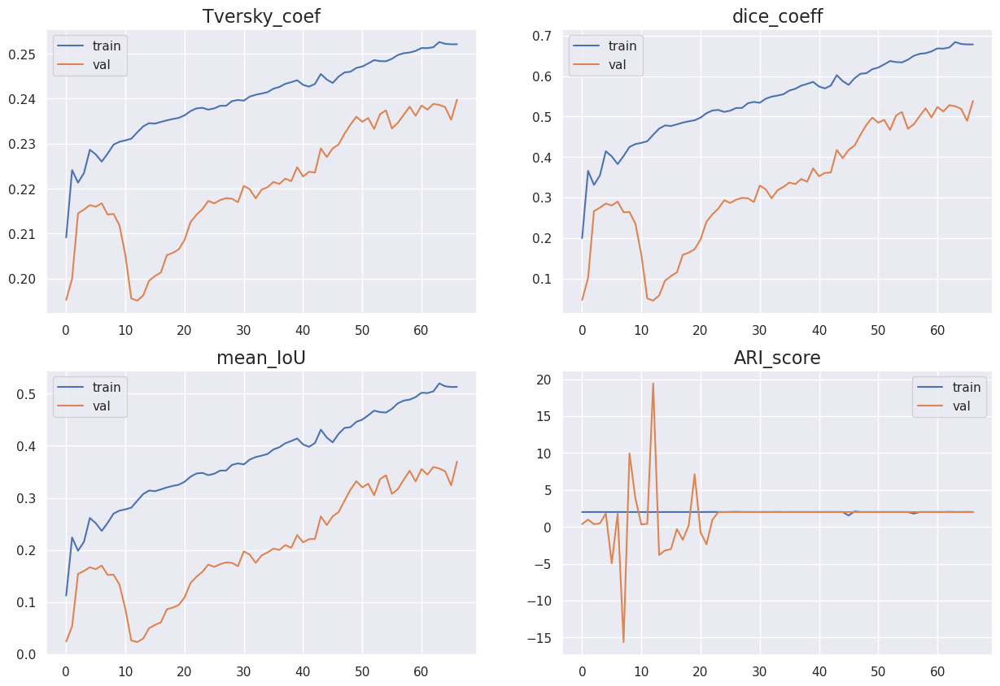

In [51]:
afficher_les_metriques( result_3 )

In [52]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_3, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [53]:
img.shape

(10, 128, 256, 3)

In [54]:
mask.shape

(10, 128, 256, 8)

In [55]:
mask_pred = model_3.predict(img)

1/1 [==============================] - 1s 1s/step


In [56]:
mask_pred.shape

(10, 128, 256, 8)

In [57]:
transformer = Mask_To_8_Groups()

In [58]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

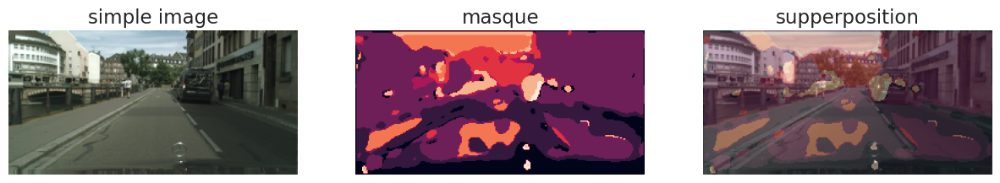

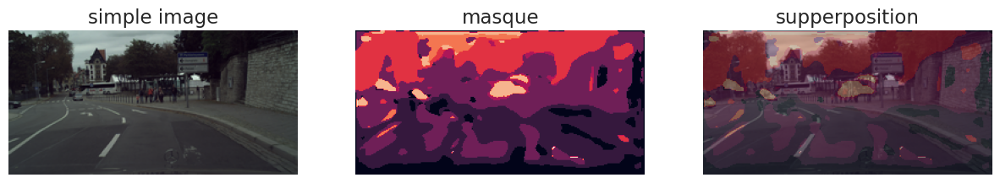

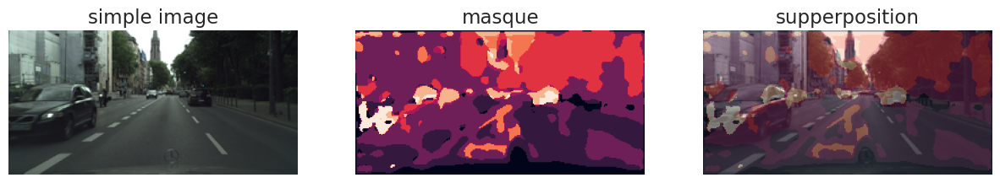

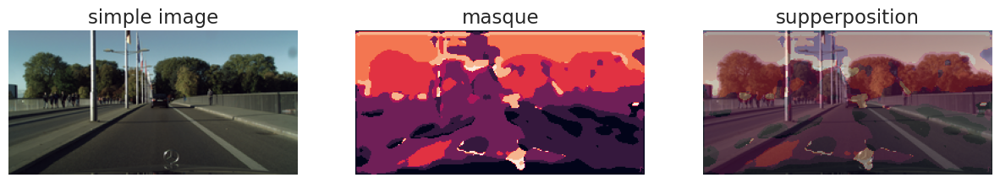

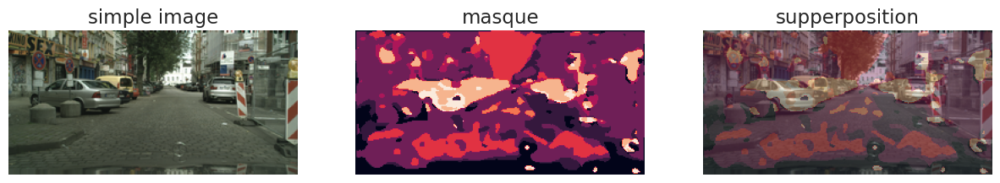

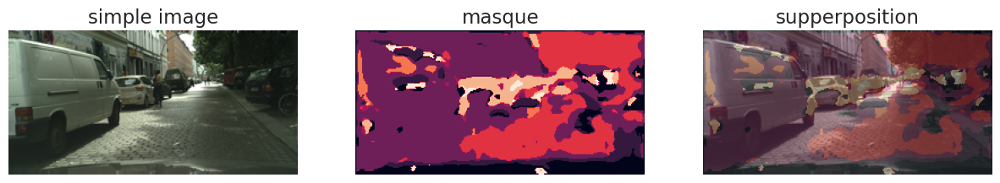

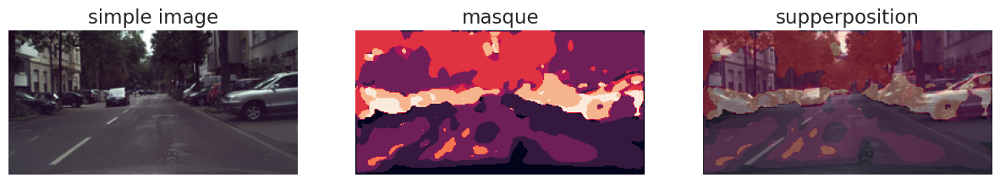

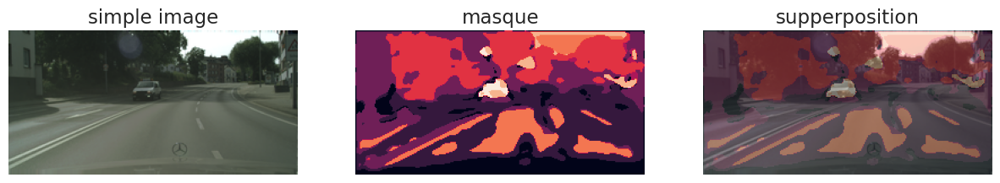

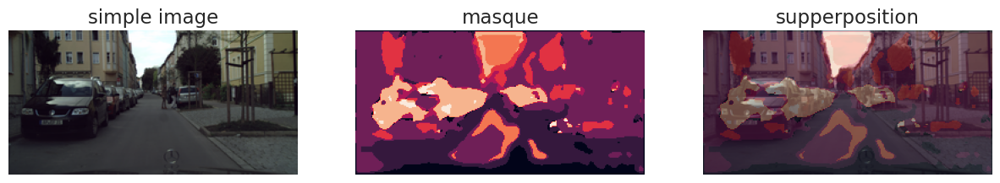

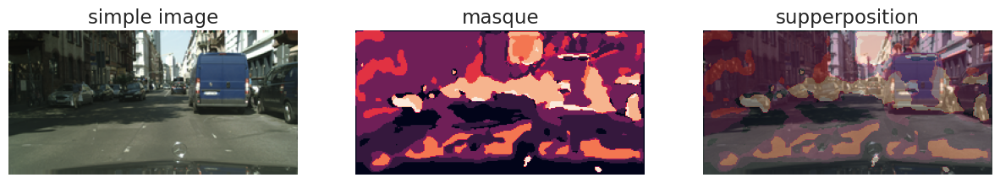

In [59]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> D - Sans augmentation de données avec fonction perte de type categorical_focal_jaccard_loss

In [60]:
#resolution des images et masques
aug_4 = False
perte_4 = "categorical_focal_jaccard_loss"
img_res = (128,256,3)

In [ ]:
model_4 = TL_unet_model( img_res , 8)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [ ]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_4.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_jaccard_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_4 = f"models/{model_name}_Loss={perte_4}_aug={aug_4}_/cp.ckpt"
checkpoint_dir_4 = os.path.dirname(checkpoint_path_4)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_4 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_4,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 125
                                                  )
early_stopping_4 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_4 = False

In [63]:
if charger_les_poids_4  :
    model_4.load_weights(checkpoint_path_4)
    
    
history_4 = model_4.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_4, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_4, taille_des_donnees= 15, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_4, early_stopping_4 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_4.save(checkpoint_dir_4+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 37s 19s/step - loss: 0.9860 - ARI_score: 1.6211 - mean_IoU: 0.1013 - dice_coeff: 0.1826 - Tversky_coef: 0.2076 - val_loss: 1.3504 - val_ARI_score: -4.3213 - val_mean_IoU: 0.1176 - val_dice_coeff: 0.2102 - val_Tversky_coef: 0.2096 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 51s 25s/step - loss: 0.9307 - ARI_score: 1.9958 - mean_IoU: 0.2351 - dice_coeff: 0.3791 - Tversky_coef: 0.2254 - val_loss: 1.4180 - val_ARI_score: 0.6176 - val_mean_IoU: 0.0724 - val_dice_coeff: 0.1350 - val_Tversky_coef: 0.2030 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 49s 26s/step - loss: 0.8970 - ARI_score: 1.9988 - mean_IoU: 0.3191 - dice_coeff: 0.4838 - Tversky_coef: 0.2343 - val_loss: 1.3579 - val_ARI_score: -0.9984 - val_mean_IoU: 0.1324 - val_dice_coeff: 0.2314 - val_Tversky_coef: 0.2115 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 29s 13s/step - loss: 0.8707 - ARI_score: 0.5379 - mean_IoU: 0.3216 -

In [64]:
result_4  = pd.DataFrame( history_4.history )
result_4.drop(["lr"], axis = 1, inplace = True)
result_4["modèle"] = [model_name for _ in range( result_4.shape[0])]
result_4["Loss"] = [perte_4 for _ in range( result_4.shape[0])]
result_4["Augmentation"] = [aug_4 for _ in range( result_4.shape[0])]
result_4.to_csv(f"{model_name}_loss={perte_4}_augment={aug_4}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_4

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.985973,1.621136,0.101274,0.182632,0.207601,1.350366,-4.321330,0.117637,0.210228,0.209639,Transfert_learning_UNET,categorical_focal_jaccard_loss,False
1,0.930657,1.995751,0.235113,0.379122,0.225432,1.418013,0.617595,0.072450,0.134988,0.203001,Transfert_learning_UNET,categorical_focal_jaccard_loss,False
2,0.897048,1.998826,0.319111,0.483782,0.234254,1.357949,-0.998398,0.132391,0.231421,0.211519,Transfert_learning_UNET,categorical_focal_jaccard_loss,False
3,0.870715,0.537917,0.321616,0.486680,0.234538,1.370500,0.546594,0.086939,0.159593,0.205178,Transfert_learning_UNET,categorical_focal_jaccard_loss,False
4,0.820358,1.996349,0.337508,0.504678,0.236288,1.354403,3.026042,0.111031,0.199864,0.208732,Transfert_learning_UNET,categorical_focal_jaccard_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
131,0.278598,-1.949609,0.835500,0.910306,0.271493,0.546251,19.288729,0.674666,0.805727,0.262319,Transfert_learning_UNET,categorical_focal_jaccard_loss,False
132,0.270653,22.182146,0.839467,0.912723,0.271705,0.553234,-3.756737,0.673536,0.804665,0.262226,Transfert_learning_UNET,categorical_focal_jaccard_loss,False
133,0.278065,-1.122237,0.841298,0.913807,0.271800,0.541533,0.656988,0.696292,0.820109,0.263581,Transfert_learning_UNET,categorical_focal_jaccard_loss,False
134,0.283656,-6.231594,0.835165,0.910161,0.271480,0.585297,-1.773247,0.631047,0.772644,0.259412,Transfert_learning_UNET,categorical_focal_jaccard_loss,False


In [65]:
start = 0

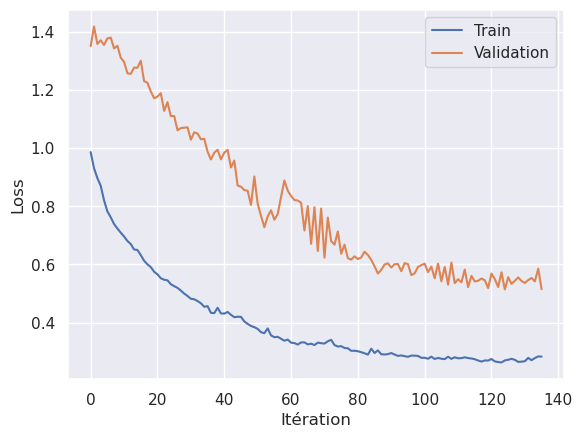

In [66]:
plt.plot(result_4.index[start:], result_4["loss"][start:])
plt.plot(result_4.index[start:], result_4["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


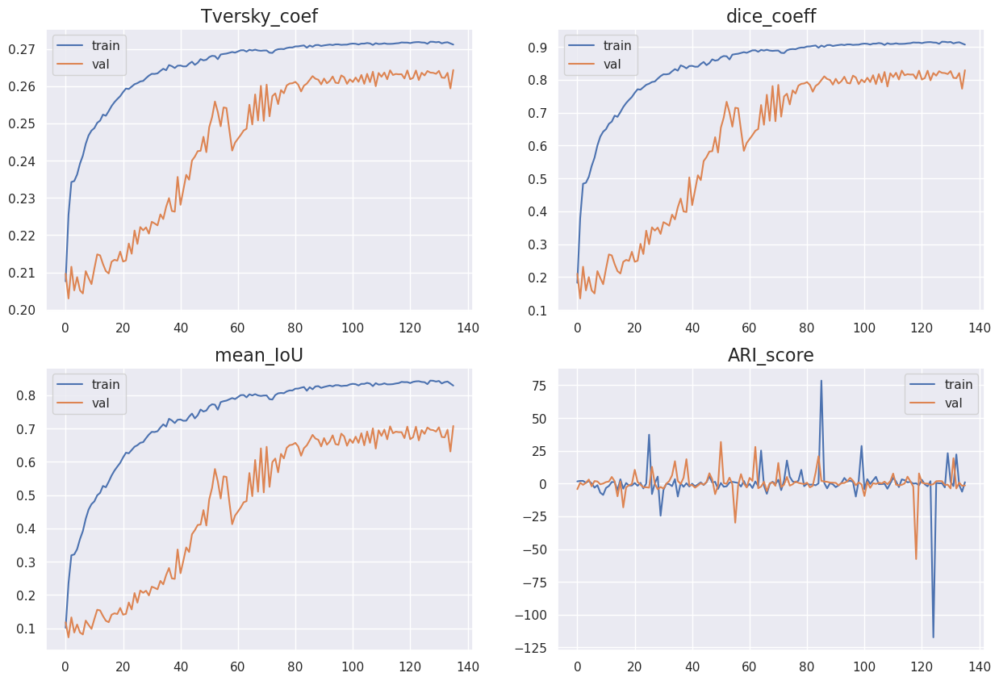

In [67]:
afficher_les_metriques( result_4 )

In [68]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_4, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [69]:
img.shape

(10, 128, 256, 3)

In [70]:
mask.shape

(10, 128, 256, 8)

In [71]:
mask_pred = model_4.predict(img)

1/1 [==============================] - 2s 2s/step


In [72]:
mask_pred.shape

(10, 128, 256, 8)

In [73]:
transformer = Mask_To_8_Groups()

In [74]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [75]:
np.unique( mask_pred )

array([0, 1, 2, 3, 4, 5, 6, 7])

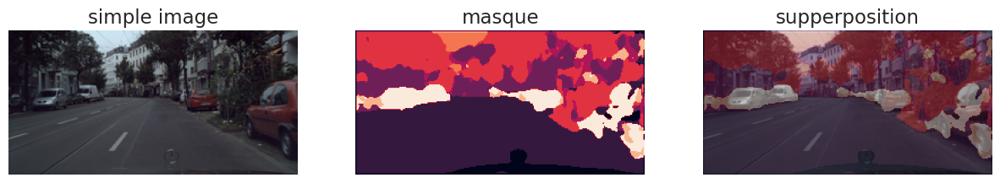

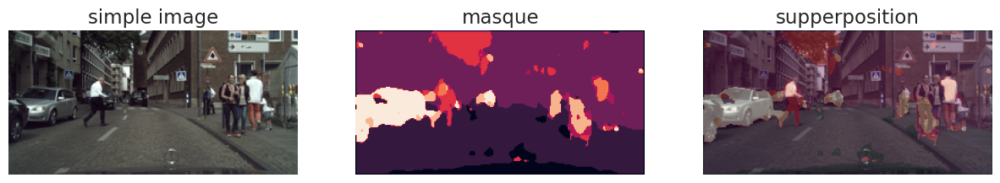

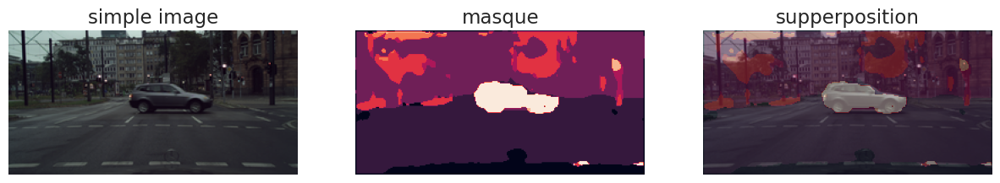

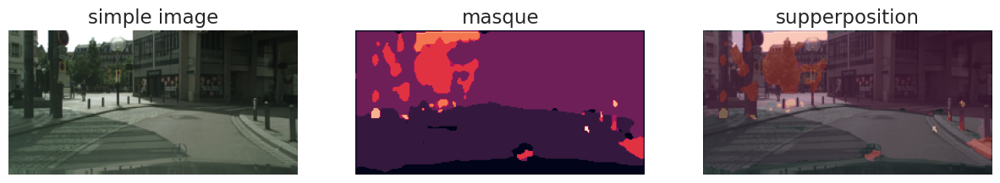

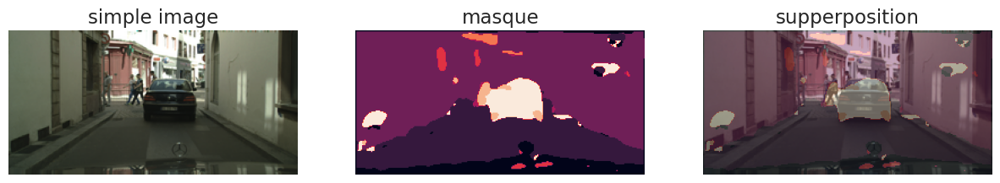

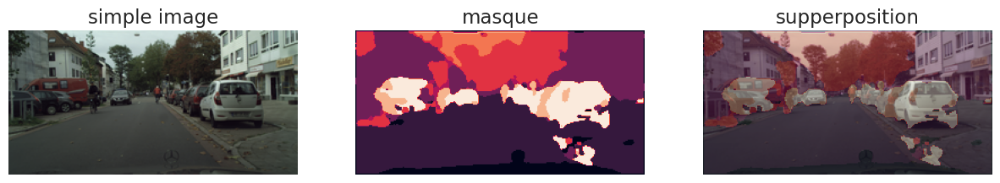

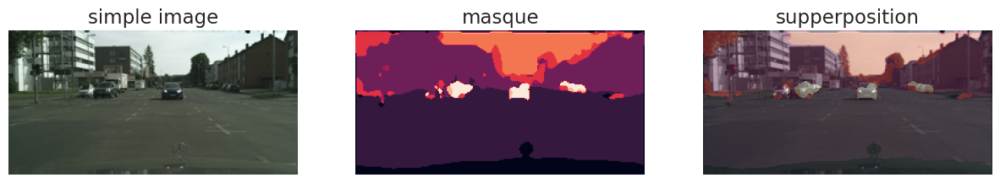

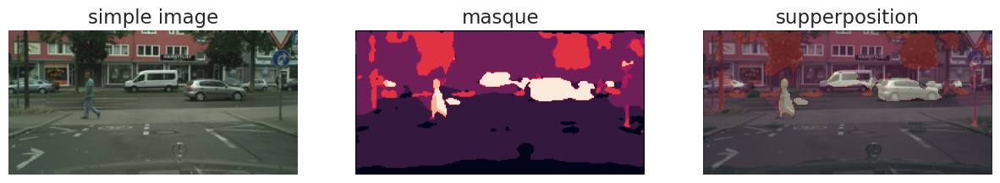

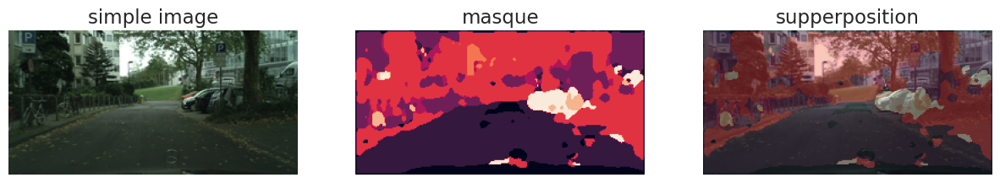

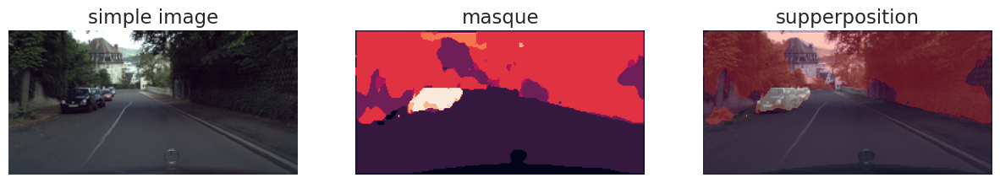

In [76]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

In [77]:
result_1.iloc[-50:,:].max().values

array([0.46264344453811646, 15.458255767822266, 0.8032243251800537,
       0.8908703327178955, 0.2697542905807495, 0.7985409498214722,
       258.24163818359375, 0.5467260479927063, 0.7060247659683228,
       0.25337547063827515, 'Transfert_learning_UNET', 'jaccard_loss',
       False], dtype=object)

In [78]:
recap = pd.DataFrame([result_1.iloc[-70:,:].max().values , 
              result_2.iloc[-70:,:].max().values,
              result_3.iloc[-70:,:].max().values, 
              result_4.iloc[-70:,:].max().values],
             columns= result_1.keys()
            ).drop(["loss","ARI_score","val_ARI_score","val_loss"], axis = 1)

recap

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.803224,0.890870,0.269754,0.546726,0.706025,0.253375,Transfert_learning_UNET,jaccard_loss,False
1,0.464027,0.633378,0.246937,0.383669,0.548988,0.239680,Transfert_learning_UNET,dice_loss,False
2,0.519803,0.684039,0.252582,0.369610,0.538498,0.239779,Transfert_learning_UNET,categorical_focal_loss,False
3,0.844026,0.915395,0.271937,0.707761,0.828775,0.264345,Transfert_learning_UNET,categorical_focal_jaccard_loss,False


In [79]:
recap.style.highlight_min(axis=0, color='red').highlight_max(axis=0, color='green')

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.803224,0.890870,0.269754,0.546726,0.706025,0.253375,Transfert_learning_UNET,jaccard_loss,False
1,0.464027,0.633378,0.246937,0.383669,0.548988,0.239680,Transfert_learning_UNET,dice_loss,False
2,0.519803,0.684039,0.252582,0.369610,0.538498,0.239779,Transfert_learning_UNET,categorical_focal_loss,False
3,0.844026,0.915395,0.271937,0.707761,0.828775,0.264345,Transfert_learning_UNET,categorical_focal_jaccard_loss,False


In [80]:
#if "recap.csv" in os.listdir() : 
#    x = pd.read_csv("recep.csv")
#    recap = pd.concat([x , recap], axis = 0, ignore_index=True)
#    recap.drop_duplicates(["modèle","Loss","Augmentation"], inplace=True)

recap.to_csv(f"recap_{model_name}.csv", index = False)


# <strong> E - Sans augmentation de données avec fonction perte de type categorical_focal_dice_loss

In [81]:
#resolution des images et masques
aug_5 = False
perte_5 = "categorical_focal_dice_loss"
img_res = (128,256,3)

In [82]:
model_5 = TL_unet_model( img_res , 8)

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [83]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_5.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_5 = f"models/{model_name}_Loss={perte_5}_aug={aug_5}_/cp.ckpt"
checkpoint_dir_5 = os.path.dirname(checkpoint_path_5)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_5 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_5,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 125
                                                  )
early_stopping_5 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_5 = False

In [84]:
if charger_les_poids_5  :
    model_5.load_weights(checkpoint_path_5)
    
    
history_5 = model_5.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_5, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_5, taille_des_donnees= 15, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_5, early_stopping_5 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_5.save(checkpoint_dir_5+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 56s 29s/step - loss: 0.9471 - ARI_score: 1.9528 - mean_IoU: 0.0847 - dice_coeff: 0.1553 - Tversky_coef: 0.2051 - val_loss: 1.3685 - val_ARI_score: -0.9697 - val_mean_IoU: 0.1040 - val_dice_coeff: 0.1878 - val_Tversky_coef: 0.2075 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 52s 27s/step - loss: 0.8617 - ARI_score: 0.1381 - mean_IoU: 0.2094 - dice_coeff: 0.3451 - Tversky_coef: 0.2224 - val_loss: 1.4097 - val_ARI_score: -2.4455 - val_mean_IoU: 0.0522 - val_dice_coeff: 0.0991 - val_Tversky_coef: 0.1997 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 57s 30s/step - loss: 0.7708 - ARI_score: 2.0142 - mean_IoU: 0.3065 - dice_coeff: 0.4689 - Tversky_coef: 0.2333 - val_loss: 1.3120 - val_ARI_score: 1.7433 - val_mean_IoU: 0.0980 - val_dice_coeff: 0.1771 - val_Tversky_coef: 0.2066 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 54s 30s/step - loss: 0.7110 - ARI_score: 2.0121 - mean_IoU: 0.3437 -

In [85]:
result_5  = pd.DataFrame( history_5.history )
result_5.drop(["lr"], axis = 1, inplace = True)
result_5["modèle"] = [model_name for _ in range( result_5.shape[0])]
result_5["Loss"] = [perte_5 for _ in range( result_5.shape[0])]
result_5["Augmentation"] = [aug_5 for _ in range( result_5.shape[0])]
result_5.to_csv(f"{model_name}_loss={perte_5}_augment={aug_5}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_5

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.947075,1.952776,0.084744,0.155295,0.205053,1.368536,-0.969727,0.104006,0.187821,0.207506,Transfert_learning_UNET,categorical_focal_dice_loss,False
1,0.861717,0.138085,0.209373,0.345106,0.222440,1.409674,-2.445520,0.052208,0.099122,0.199676,Transfert_learning_UNET,categorical_focal_dice_loss,False
2,0.770849,2.014162,0.306467,0.468940,0.233338,1.312017,1.743278,0.098035,0.177057,0.206557,Transfert_learning_UNET,categorical_focal_dice_loss,False
3,0.711022,2.012132,0.343747,0.511597,0.237206,1.210181,2.129773,0.144073,0.251839,0.213170,Transfert_learning_UNET,categorical_focal_dice_loss,False
4,0.677870,1.232320,0.362151,0.531706,0.238959,1.288252,-0.429244,0.122658,0.218158,0.210189,Transfert_learning_UNET,categorical_focal_dice_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
111,0.176801,31.529425,0.833089,0.908944,0.271413,0.453190,0.994070,0.634527,0.776011,0.259530,Transfert_learning_UNET,categorical_focal_dice_loss,False
112,0.171889,0.433912,0.834561,0.909811,0.271492,0.476213,-3.699479,0.624944,0.768800,0.258897,Transfert_learning_UNET,categorical_focal_dice_loss,False
113,0.173684,113.168930,0.835610,0.910435,0.271543,0.447777,-0.147733,0.636746,0.777635,0.259680,Transfert_learning_UNET,categorical_focal_dice_loss,False
114,0.180781,1.554021,0.835073,0.910073,0.271511,0.503966,-4.434425,0.586965,0.739502,0.256327,Transfert_learning_UNET,categorical_focal_dice_loss,False


In [86]:
start = 0

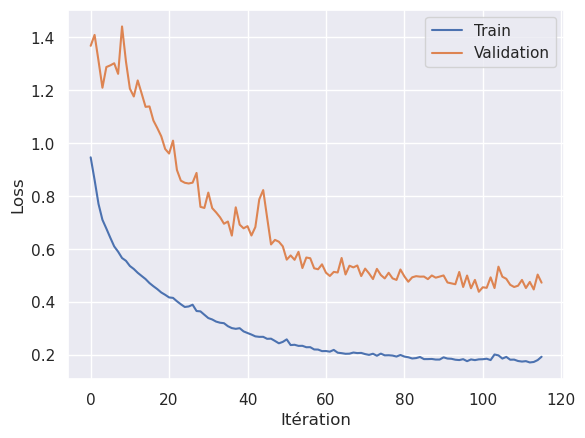

In [87]:
plt.plot(result_5.index[start:], result_5["loss"][start:])
plt.plot(result_5.index[start:], result_5["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


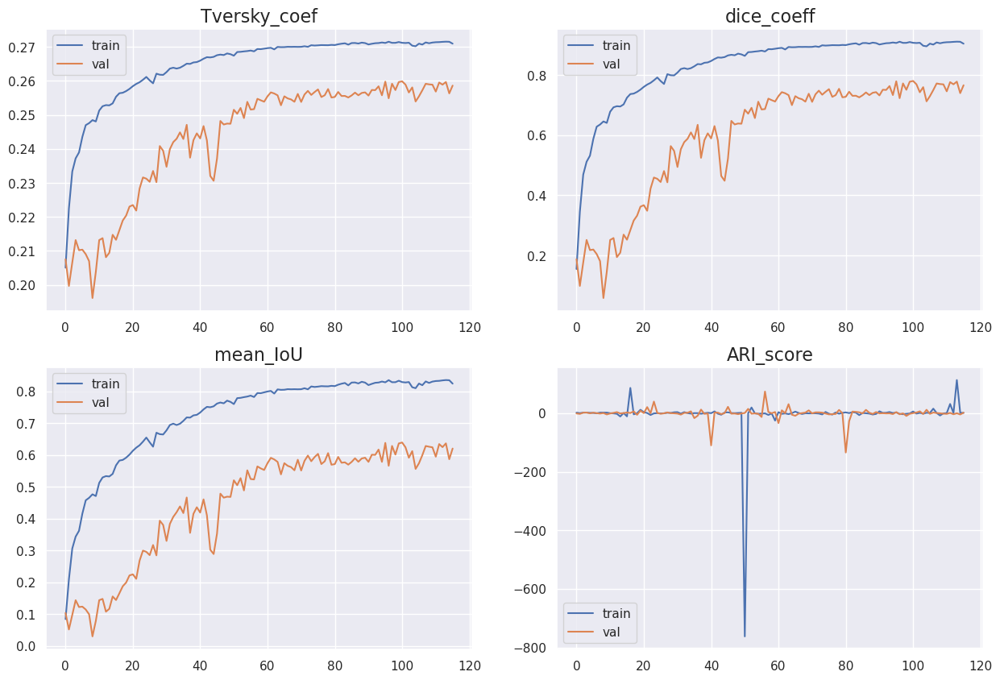

In [88]:
afficher_les_metriques( result_5 )

In [89]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_5, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [90]:
img.shape

(10, 128, 256, 3)

In [91]:
mask.shape

(10, 128, 256, 8)

In [92]:
mask_pred = model_5.predict(img)

1/1 [==============================] - 1s 1s/step


In [93]:
mask_pred.shape

(10, 128, 256, 8)

In [94]:
transformer = Mask_To_8_Groups()

In [95]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [96]:
np.unique( mask_pred )

array([0, 1, 2, 3, 4, 5, 6, 7])

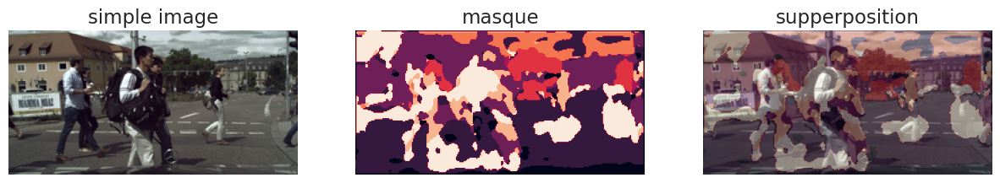

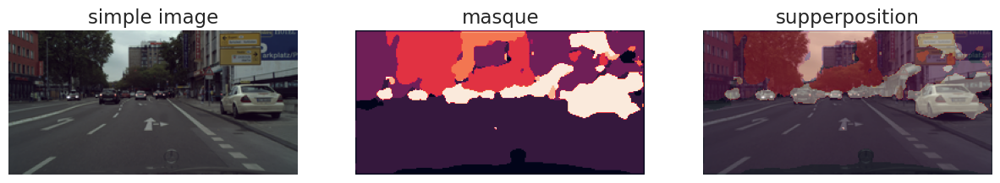

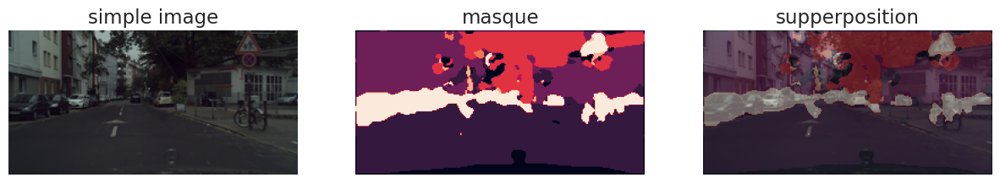

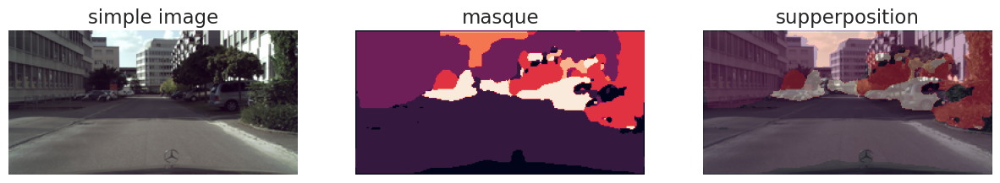

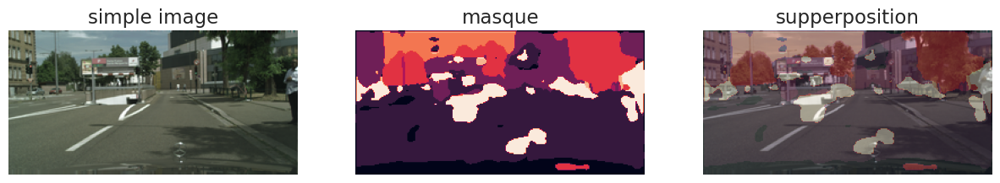

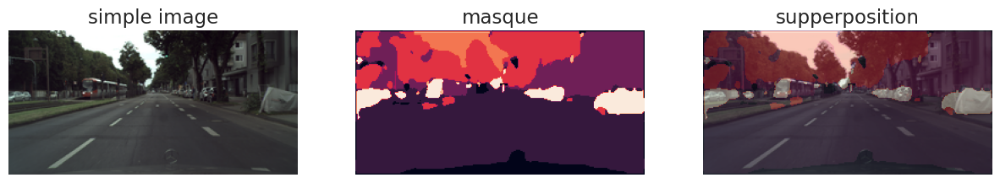

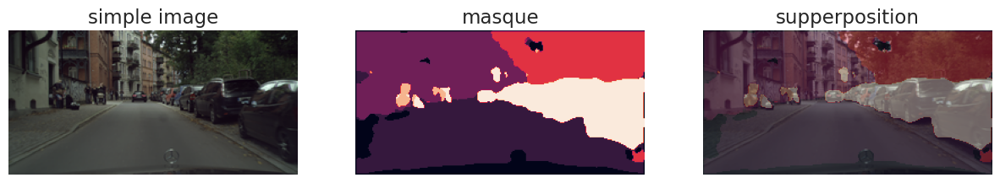

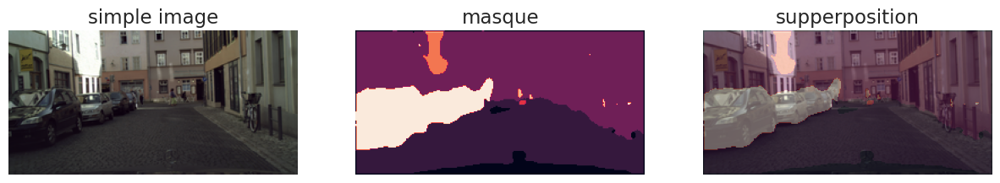

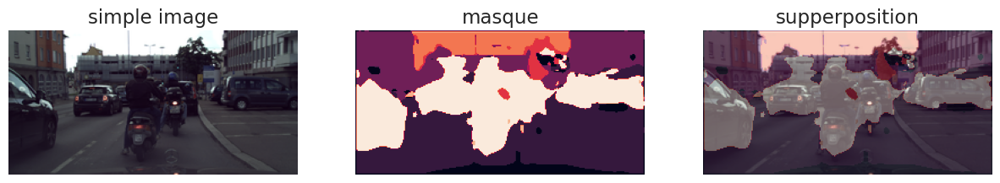

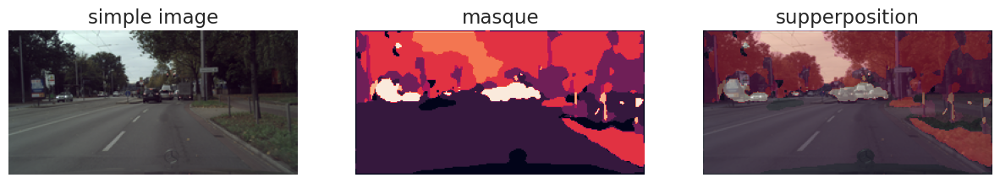

In [97]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

In [98]:
recap = pd.DataFrame([result_1.iloc[-result_1.shape[0]//2:,:].max().values , 
                      result_2.iloc[-result_2.shape[0]//2:,:].max().values,
                      result_3.iloc[-result_3.shape[0]//2:,:].max().values, 
                      result_4.iloc[-result_4.shape[0]//2:,:].max().values,
                      result_5.iloc[-result_5.shape[0]//2:,:].max().values
                     ],
                     columns= result_1.keys()
                    ).drop(["loss","ARI_score","val_ARI_score","val_loss"], axis = 1)

recap

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.803224,0.890870,0.269754,0.546726,0.706025,0.253375,Transfert_learning_UNET,jaccard_loss,False
1,0.464027,0.633378,0.246937,0.383669,0.548988,0.239680,Transfert_learning_UNET,dice_loss,False
2,0.519803,0.684039,0.252582,0.369610,0.538498,0.239779,Transfert_learning_UNET,categorical_focal_loss,False
3,0.844026,0.915395,0.271937,0.707761,0.828775,0.264345,Transfert_learning_UNET,categorical_focal_jaccard_loss,False
4,0.835610,0.910435,0.271543,0.639473,0.779913,0.259874,Transfert_learning_UNET,categorical_focal_dice_loss,False


In [99]:
recap.style.highlight_min(axis=0, color='red').highlight_max(axis=0, color='green')

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.803224,0.890870,0.269754,0.546726,0.706025,0.253375,Transfert_learning_UNET,jaccard_loss,False
1,0.464027,0.633378,0.246937,0.383669,0.548988,0.239680,Transfert_learning_UNET,dice_loss,False
2,0.519803,0.684039,0.252582,0.369610,0.538498,0.239779,Transfert_learning_UNET,categorical_focal_loss,False
3,0.844026,0.915395,0.271937,0.707761,0.828775,0.264345,Transfert_learning_UNET,categorical_focal_jaccard_loss,False
4,0.835610,0.910435,0.271543,0.639473,0.779913,0.259874,Transfert_learning_UNET,categorical_focal_dice_loss,False


In [100]:
#if "recap.csv" in os.listdir() : 
#    x = pd.read_csv("recep.csv")
#    recap = pd.concat([x , recap], axis = 0, ignore_index=True)
#    recap.drop_duplicates(["modèle","Loss","Augmentation"], inplace=True)

recap.to_csv(f"recap_{model_name}.csv", index = False)
